In [1]:
from src.utils import read_files_kpi2d, read_file_kpi3d, plot_kpi2d, plot_kpi3d

In [2]:
file_path = '/home/k64889/Masters-Thesis/data/Testing/raw/738561.65_PM180_HPIN_4layer_p4q2_doubleV_pitched_029_000004.xlsx'
#file_path= '/home/k64889/Masters-Thesis/data/AllTopologies/005__ID739469.6978315__PM180_HPIN_4layers_p4q2_SingleV_1V.xlsx'

### Plot Exploration of a 2d KPI - Mgrenz

In [3]:
nn_kpi2d, mgrenz_kpi2d = read_files_kpi2d(file_path, 'Mgrenz')

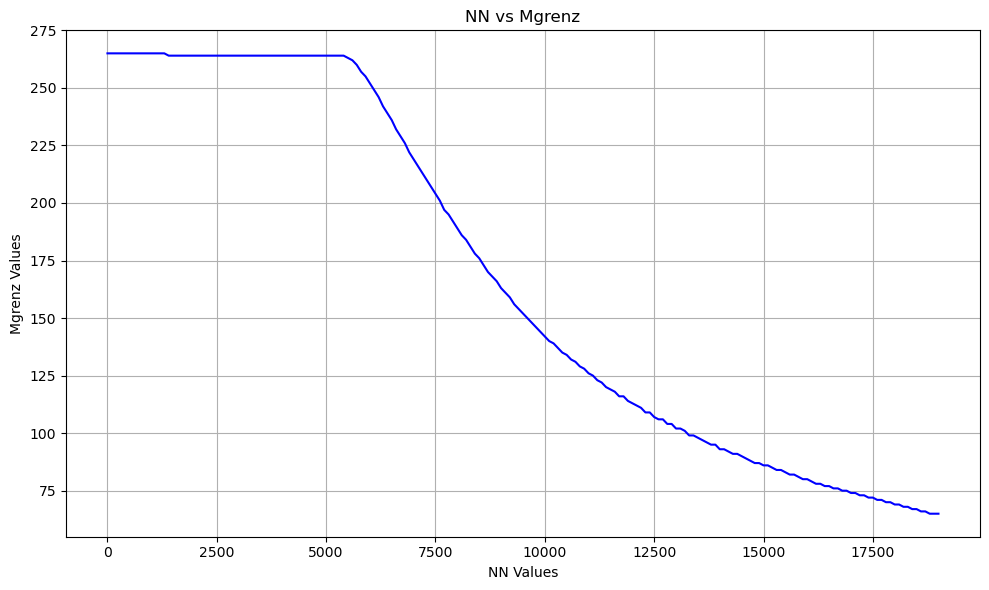

In [4]:
plot_kpi2d(nn_kpi2d, mgrenz_kpi2d)

### Plot Exploration of a 3d KPI -ETA

In [4]:
nn_kpi3d = read_file_kpi3d(file_path, 'NN')
mm_kpi3d = read_file_kpi3d(file_path, 'MM')
eta_kpi3d = read_file_kpi3d(file_path, 'ETA')

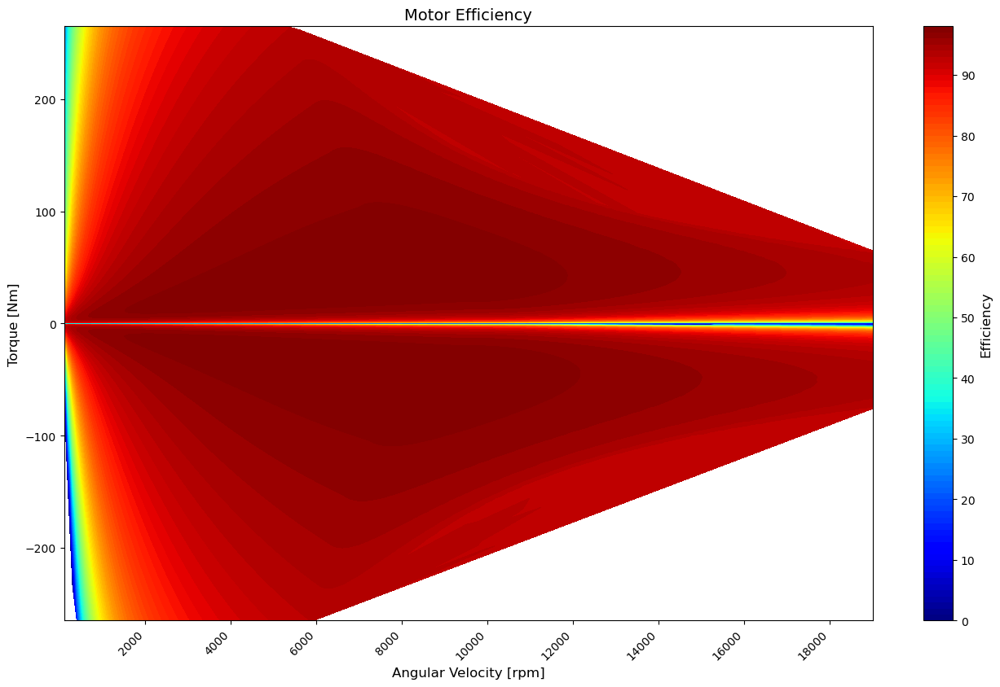

In [5]:
plot_kpi3d(nn_kpi3d, mm_kpi3d, eta_kpi3d)

### Reading the tabular data

In [6]:
import pandas as pd

In [7]:
df_inputs=pd.read_csv('./data/TabularDataInputs.csv')

In [17]:
df_inputs.describe()

,lmsov2,lth1v2,lth2v2,r1v2,r11v2,r2v2,r3v2,r4v2,rmt1v2,rmt4v2,...,dhphp,dhpng,N,simQ,r_a,r_i,rad_phiv2,rad_phiv1,rad_phi3b1,rad_phi4b1
count,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,...,1481.000000,1481.000000,1481.0,1481.0,1.481000e+03,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000
mean,-0.000289,0.005395,0.002789,0.002097,0.000326,0.001873,0.000697,0.000747,0.000249,0.000249,...,0.000264,0.000406,4.0,6.0,9.000000e-02,0.064433,-0.511319,-0.694266,-0.002522,-0.000530
std,0.000035,0.000359,0.000178,0.000322,0.000040,0.000133,0.000044,0.000048,0.000016,0.000016,...,0.000014,0.000003,0.0,0.0,2.554375e-15,0.000902,0.063678,0.054700,0.056001,0.011775
min,-0.000300,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000263,0.000406,4.0,6.0,9.000000e-02,0.064000,-0.645772,-0.785398,-1.256637,-0.261799
25%,-0.000300,0.005450,0.002800,0.002200,0.000300,0.001900,0.000700,0.000750,0.000250,0.000250,...,0.000263,0.000406,4.0,6.0,9.000000e-02,0.064000,-0.558505,-0.733038,0.000000,0.000000
50%,-0.000300,0.005450,0.002800,0.002200,0.000300,0.001900,0.000700,0.000750,0.000250,0.000250,...,0.000263,0.000406,4.0,6.0,9.000000e-02,0.064000,-0.523599,-0.698132,0.000000,0.000000
75%,-0.000300,0.005450,0.002800,0.002200,0.000350,0.001900,0.000700,0.000750,0.000250,0.000250,...,0.000263,0.000406,4.0,6.0,9.000000e-02,0.064000,-0.471239,-0.645772,0.000000,0.000000
max,0.000000,0.005450,0.002800,0.002200,0.000600,0.001900,0.000700,0.000750,0.000250,0.000250,...,0.000485,0.000453,4.0,6.0,9.000000e-02,0.067000,0.000000,-0.453786,0.000000,0.000000


In [19]:
# Convert all float columns to float16
df_inputs = df_inputs.apply(lambda x: x.astype('float16') if np.issubdtype(x.dtype, np.floating) else x)

In [20]:
df_inputs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1481 entries, 0 to 1480
Data columns (total 90 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  1481 non-null   object 
 1   lmsov2      1481 non-null   float16
 2   lth1v2      1481 non-null   float16
 3   lth2v2      1481 non-null   float16
 4   r1v2        1481 non-null   float16
 5   r11v2       1481 non-null   float16
 6   r2v2        1481 non-null   float16
 7   r3v2        1481 non-null   float16
 8   r4v2        1481 non-null   float16
 9   rmt1v2      1481 non-null   float16
 10  rmt4v2      1481 non-null   float16
 11  rlt1v2      1481 non-null   float16
 12  rlt4v2      1481 non-null   float16
 13  hav2        1481 non-null   float16
 14  mbv2        1481 non-null   float16
 15  mhv2        1481 non-null   float16
 16  rmagv2      1481 non-null   float16
 17  dsmv2       1481 non-null   float16
 18  dsmuv2      1481 non-null   float16
 19  amtrv2      1481 non-null  

### Statistical Plots of Data

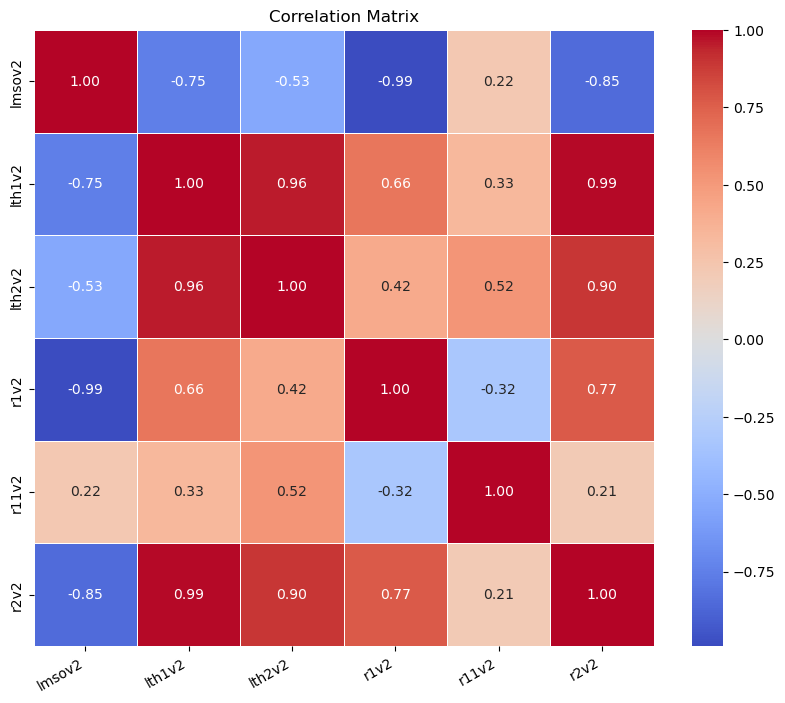

In [21]:
import seaborn as sns
# Assign the columns
columns_of_interest = ['lmsov2', 'lth1v2', 'lth2v2', 'r1v2', 'r11v2', 'r2v2']

# Calculate the correlation matrix
correlation_matrix = df_inputs[columns_of_interest].corr()

# Display the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix')
plt.xticks(rotation=30, ha='right')
plt.show()

In [22]:
df_inputs

,Unnamed: 0,lmsov2,lth1v2,lth2v2,r1v2,r11v2,r2v2,r3v2,r4v2,rmt1v2,...,dhphp,dhpng,N,simQ,r_a,r_i,rad_phiv2,rad_phiv1,rad_phi3b1,rad_phi4b1
0,738562.5564_PM180_HPIN_4layer_p4q2_doubleV_pit...,-0.0002,0.005100,0.0028,0.001200,0.00040,0.0017,0.0007,0.00075,0.00025,...,0.000263,0.000406,4.0,6.0,0.090027,0.067017,-0.453857,-0.645996,0.0,0.0
1,738561.6593_PM180_HPIN_4layer_p4q2_doubleV_pit...,-0.0003,0.005451,0.0028,0.002199,0.00035,0.0019,0.0007,0.00075,0.00025,...,0.000263,0.000406,4.0,6.0,0.090027,0.064026,-0.558594,-0.785156,0.0,0.0
2,738561.7042_PM180_HPIN_4layer_p4q2_doubleV_pit...,-0.0003,0.005451,0.0028,0.002199,0.00030,0.0019,0.0007,0.00075,0.00025,...,0.000263,0.000406,4.0,6.0,0.090027,0.064026,-0.523438,-0.715820,0.0,0.0
3,738561.7173_PM180_HPIN_4layer_p4q2_doubleV_pit...,-0.0003,0.005451,0.0028,0.002199,0.00030,0.0019,0.0007,0.00075,0.00025,...,0.000263,0.000406,4.0,6.0,0.090027,0.064026,-0.506348,-0.732910,0.0,0.0
4,738561.7112_PM180_HPIN_4layer_p4q2_doubleV_pit...,-0.0003,0.005451,0.0028,0.002199,0.00030,0.0019,0.0007,0.00075,0.00025,...,0.000263,0.000406,4.0,6.0,0.090027,0.064026,-0.593262,-0.628418,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1476,738561.6341_PM180_HPIN_4layer_p4q2_doubleV_pit...,-0.0003,0.005451,0.0028,0.002199,0.00035,0.0019,0.0007,0.00075,0.00025,...,0.000263,0.000406,4.0,6.0,0.090027,0.064026,-0.576172,-0.593262,0.0,0.0
1477,738561.6437_PM180_HPIN_4layer_p4q2_doubleV_pit...,-0.0003,0.005451,0.0028,0.002199,0.00035,0.0019,0.0007,0.00075,0.00025,...,0.000263,0.000406,4.0,6.0,0.090027,0.064026,-0.523438,-0.750488,0.0,0.0
1478,738562.5603_PM180_HPIN_4layer_p4q2_doubleV_pit...,-0.0002,0.005100,0.0028,0.001200,0.00040,0.0017,0.0007,0.00075,0.00025,...,0.000263,0.000406,4.0,6.0,0.090027,0.067017,-0.453857,-0.698242,0.0,0.0
1479,738561.6945_PM180_HPIN_4layer_p4q2_doubleV_pit...,-0.0003,0.005451,0.0028,0.002199,0.00030,0.0019,0.0007,0.00075,0.00025,...,0.000263,0.000406,4.0,6.0,0.090027,0.064026,-0.558594,-0.750488,0.0,0.0


In [72]:
# import matplotlib.pyplot as plt
# import matplotlib.pyplot as plt

# for column in df_inputs.columns:
#     plt.figure(figsize=(10, 6))  # Create a figure for each histogram
#     plt.hist(df_inputs[column], bins=30, edgecolor='k')  # Adjust bins as necessary
#     plt.title(f'Histogram for {column}')
#     plt.xlabel(column)
#     plt.ylabel('Frequency')
#     plt.grid(True)
#     plt.show()

In [7]:
df_targets=pd.read_csv('./data/TabularDataTargets.csv')

In [8]:
df_targets

,Unnamed: 0,Column_1,Column_2,Column_3,Column_4,Column_5,Column_6,Column_7,Column_8,Column_9,...,Column_182,Column_183,Column_184,Column_185,Column_186,Column_187,Column_188,Column_189,Column_190,Column_191
0,738562.5564_PM180_HPIN_4layer_p4q2_doubleV_pit...,279,278,278,278,278,278,278,278,278,...,66,65,65,65,64,64,63,63,63,62
1,738561.6593_PM180_HPIN_4layer_p4q2_doubleV_pit...,259,259,259,259,259,259,259,259,259,...,70,69,69,69,68,68,67,67,66,66
2,738561.7042_PM180_HPIN_4layer_p4q2_doubleV_pit...,255,255,255,255,255,255,255,255,255,...,67,66,66,65,65,65,64,64,63,63
3,738561.7173_PM180_HPIN_4layer_p4q2_doubleV_pit...,249,249,249,249,249,249,248,248,248,...,64,63,62,62,62,61,61,60,60,60
4,738561.7112_PM180_HPIN_4layer_p4q2_doubleV_pit...,245,245,245,245,245,245,245,245,245,...,62,62,61,61,60,60,59,59,59,58
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1476,738561.6341_PM180_HPIN_4layer_p4q2_doubleV_pit...,255,255,255,255,255,255,255,255,255,...,67,67,66,66,66,65,65,64,64,63
1477,738561.6437_PM180_HPIN_4layer_p4q2_doubleV_pit...,257,257,257,257,257,257,257,257,257,...,69,68,68,67,67,66,66,66,65,65
1478,738562.5603_PM180_HPIN_4layer_p4q2_doubleV_pit...,278,278,278,278,277,277,277,277,277,...,66,66,65,65,64,64,64,63,63,62
1479,738561.6945_PM180_HPIN_4layer_p4q2_doubleV_pit...,252,251,251,251,251,251,251,251,251,...,66,65,65,64,64,64,63,63,63,62


In [9]:
df_targets.describe()

,Column_1,Column_2,Column_3,Column_4,Column_5,Column_6,Column_7,Column_8,Column_9,Column_10,...,Column_182,Column_183,Column_184,Column_185,Column_186,Column_187,Column_188,Column_189,Column_190,Column_191
count,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,...,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000,1481.000000
mean,257.240378,256.906820,256.896016,256.886563,256.875084,256.860905,256.846725,256.835922,256.818366,256.806887,...,65.884537,65.409858,65.001350,64.553680,64.128967,63.717758,63.280891,62.902768,62.471303,62.088454
std,8.505897,8.473853,8.473727,8.472489,8.470772,8.469155,8.466716,8.465954,8.469187,8.467776,...,2.697253,2.671195,2.660014,2.633462,2.632485,2.598599,2.605756,2.575875,2.562335,2.551816
min,216.000000,215.000000,215.000000,215.000000,215.000000,215.000000,215.000000,215.000000,215.000000,215.000000,...,48.000000,48.000000,48.000000,47.000000,47.000000,47.000000,46.000000,46.000000,46.000000,46.000000
25%,252.000000,251.000000,251.000000,251.000000,251.000000,251.000000,251.000000,251.000000,251.000000,251.000000,...,64.000000,63.000000,63.000000,62.000000,62.000000,62.000000,61.000000,61.000000,60.000000,60.000000
50%,256.000000,256.000000,256.000000,256.000000,256.000000,256.000000,256.000000,256.000000,256.000000,256.000000,...,66.000000,66.000000,65.000000,65.000000,64.000000,64.000000,64.000000,63.000000,63.000000,62.000000
75%,261.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,260.000000,...,68.000000,68.000000,67.000000,67.000000,66.000000,66.000000,66.000000,65.000000,65.000000,64.000000
max,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000,280.000000,...,70.000000,70.000000,69.000000,69.000000,68.000000,68.000000,67.000000,67.000000,66.000000,66.000000


### Statistical Plots on Class Imbalance

## Model training 

In [1]:
from src.data_preprocessing_tabular import data_prep

In [2]:
import joblib

test_size=50
x_normalized, y1_normalized, y2_normalized, scaler_x, scaler_y1, scaler_y2, input_size, df_test_inputs, df_test_y1_targets, max_mgrenz = data_prep(test_size)

# Store scalers and split test dataset locally to disk
joblib.dump(scaler_x, './Intermediate/scaler_x.pkl')
joblib.dump(scaler_y1, './Intermediate/scaler_y1.pkl')
joblib.dump(scaler_y2, './Intermediate/scaler_y2.pkl')
joblib.dump(max_mgrenz, './Intermediate/max_mgrenz.pkl')
df_test_inputs.to_pickle('./data/df_test_inputs.pkl')
df_test_y1_targets.to_pickle('./data/df_test_y1_targets.pkl')

280


/home/k64889/miniconda3/envs/thesis/lib/python3.10/site-packages/sklearn/utils/_array_api.py:701: RuntimeWarning: All-NaN slice encountered
  return xp.asarray(numpy.nanmin(X, axis=axis))
/home/k64889/miniconda3/envs/thesis/lib/python3.10/site-packages/sklearn/utils/_array_api.py:718: RuntimeWarning: All-NaN slice encountered
  return xp.asarray(numpy.nanmax(X, axis=axis))


1.0000000000000284
-1.0


In [3]:
print(x_normalized.shape)
print(y1_normalized.shape)
print(y2_normalized.shape)

(1431, 89)
(1431, 191)
(1431, 561, 191)


In [4]:
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


/home/k64889/miniconda3/envs/thesis/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [5]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset
from src.model import mlp_kpi3d
from src.training import mlp_kpi3d_trainer as mlp_kpi3d_trainer, Y1LossRegularisation as loss_reg_y1, Y2LossRegularisation as loss_reg_y2, MSELoss as mseloss
from sklearn.model_selection import KFold
import wandb
import numpy as np
import torch.optim.lr_scheduler as lr_scheduler
from src.utils import artifact_deletion

#hyperparameters
p=0.2   # dropout rate
hidden_sizes = 256  #256 max..else OOM
batch_size = 72     ##try with 72 also
epochs = 8
learning_rate = 0.00075
lambda_y1=2.5
lambda_y2=1.5
splits=5
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

kf = KFold(n_splits=splits, shuffle=True, random_state=42)##Goto store splits and load from there to be sure of reproducibiiity
# Store the cross-validation splits
splits_file = './Intermediate/cross_val_splits.npy'
# splits_indices=kf.split(x_normalized)
# splits_indices = [(train_index, val_index) for train_index, val_index in kf.split(x_normalized)]
# np.save(splits_file, np.array(splits_indices, dtype=object), allow_pickle=True)

# Load the cross-validation splits
splits_indices = np.load(splits_file, allow_pickle=True)

# Lists to store results
cross_train_losses_y1, cross_train_losses_y2 = [], []
cross_val_losses_y1, cross_val_losses_y2 = [], []
cross_train_score_y1, cross_train_score_y2 = [], []
cross_val_score_y1, cross_val_score_y2  = [], []

best_combined_loss = 300
best_y1_score = 10
best_y2_score = 10
best_model = None
best_fold = -1

for fold, (train_index, val_index) in enumerate(splits_indices, 1):
    
    # Initialize wandb with a group to aggregate all runs of each cross-validation fold
    wandb.init(project="EM", config={
        "learning_rate": learning_rate,
        "architecture": "MLP",
        "hidden sizes": hidden_sizes,
        "epochs": epochs,
        "y1 lambda loss regularizer": lambda_y1,
        "y2 lambda loss regularizer": lambda_y2,
        "Learning Rate Scheduler": "exponential",
        "Dropout Rate": p,
        "Notes": "Changed the input scaling from Std to MinMax"
        }, group="42", name=f"Fold {fold}")
    
    
    # Train-Validation data as per cross val splits
    x_train, x_val = x_normalized[train_index], x_normalized[val_index]
    y1_train, y1_val = y1_normalized[train_index], y1_normalized[val_index]
    y2_train, y2_val = y2_normalized[train_index], y2_normalized[val_index]
    
    train_dataset = TensorDataset(torch.FloatTensor(x_train).to(device), torch.FloatTensor(y1_train).to(device), torch.FloatTensor(y2_train).to(device))
    val_dataset = TensorDataset(torch.FloatTensor(x_val).to(device), torch.FloatTensor(y1_val).to(device), torch.FloatTensor(y2_val).to(device))
    
    y2_shape = (batch_size, y2_train.shape[1], y2_train.shape[2])  
    y1_shape = (batch_size, y1_train.shape[1]) 
    
    #Shouldnt the final layers in model be multipled with batch size? -TODO
    
    model = mlp_kpi3d(input_size, hidden_sizes, y1_shape, y2_shape,p)
    
    loss1 = loss_reg_y1(lambda_y1)
    loss2 = loss_reg_y2(lambda_y2)
    
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    #lrscheduler = lr_scheduler.LinearLR(optimizer, total_iters=10)
    lrscheduler = lr_scheduler.ExponentialLR(optimizer, gamma=0.9)
    
    trainer = mlp_kpi3d_trainer(model, train_dataset, val_dataset, batch_size, loss1, loss2, optimizer, lrscheduler, device)
    
    trainer.train(epochs)

    cross_train_losses_y1.append(trainer.train_loss_history_y1)
    cross_train_losses_y2.append(trainer.train_loss_history_y2)
    cross_val_losses_y1.append(trainer.val_loss_history_y1)
    cross_val_losses_y2.append(trainer.val_loss_history_y2)
    cross_train_score_y1.append(trainer.train_score_history_y1)
    cross_train_score_y2.append(trainer.train_score_history_y2)
    cross_val_score_y1.append(trainer.val_score_history_y1)
    cross_val_score_y2.append(trainer.val_score_history_y2)
    
    # Combined loss of y1 and y2 per fold
    combined_loss = trainer.val_loss_history_y1[-1] + trainer.val_loss_history_y2[-1]
    
    # Combined loss of y1 and y2 to be the least and r2 score to be as close to 1 as possible
    if combined_loss < best_combined_loss and trainer.val_score_history_y1[-1] < best_y1_score and trainer.val_score_history_y2[-1] < best_y1_score:
        best_combined_loss = combined_loss
        best_y1_score = trainer.val_score_history_y1[-1]
        best_y2_score = trainer.val_score_history_y2[-1]
        print(f"Fold : {fold} Best combined loss: {best_combined_loss} Best y1 score: {best_y1_score} Best y2 score: {best_y2_score}")
        best_model = model
        best_fold = fold

    
if best_model is not None:
    model.save('./Intermediate/model.pth')
    print(f"Best model saved from fold {best_fold}")
else:
    print("No model met the criteria for saving")
        
#Save the best model as an artifact to wandb...can also save cross val splits if necessary, altho think not...
model_artifact = wandb.Artifact(f"best_model_fold_{fold}", type="model")
model_artifact.add_file('./Intermediate/model.pth')
model_artifact.metadata['best_y1_score'] = best_y1_score
model_artifact.metadata['best_y2_score'] = best_y2_score
model_artifact.metadata['best_combined_loss'] = best_combined_loss
model_artifact.metadata['model skeleton'] = best_model

wandb.log_artifact(model_artifact)

wandb.finish()##consider changing back if wandb is not functioning as it should

# Calculate average metrics across folds
avg_train_losses_y1 = torch.mean(torch.tensor(cross_train_losses_y1), dim=0)
avg_train_losses_y2 = torch.mean(torch.tensor(cross_train_losses_y2), dim=0)
avg_val_losses_y1 = torch.mean(torch.tensor(cross_val_losses_y1), dim=0)
avg_val_losses_y2 = torch.mean(torch.tensor(cross_val_losses_y2), dim=0)

avg_train_r2_y1 = torch.mean(torch.tensor(cross_train_score_y1), dim=0)
avg_train_r2_y2 = torch.mean(torch.tensor(cross_train_score_y2), dim=0)
avg_val_r2_y1 = torch.mean(torch.tensor(cross_val_score_y1), dim=0)
avg_val_r2_y2 = torch.mean(torch.tensor(cross_val_score_y2), dim=0)


# Print the best fold's performance
print(f"Best fold: {best_fold}")
print(f"Best combined validation loss: {best_combined_loss}")
print(f"Best validation Score for y1: {best_y1_score}")
print(f"Best validation Score for y2: {best_y2_score}")

#Disk quota dangerously exceeding, so delete the artifact locally immediately after training
artifact_deletion()

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: lilly-abraham (lilly-abraham-technische-hochschule-w-rzburg-schweinfurt). Use `wandb login --relogin` to force relogin


Fold : 1 Best combined loss: 0.019307404326704834 Best y1 score: 0.07771811634302139 Best y2 score: 0.7282418012619019


train_loss,█▂▂▁▁▁▁▁
train_loss_y1,█▃▂▁▁▁▁▁
train_loss_y2,█▂▂▁▁▁▁▁
train_score,█▃▂▁▂▁▁▁
train_score_y1,█▃▂▁▂▁▁▁
train_score_y2,█▃▂▂▂▂▁▁
val_loss,█▄▂▁▂▁▁▁
val_loss_y1,█▃▂▁▁▁▁▁
val_loss_y2,█▄▂▂▃▁▁▁
val_score,█▄▃▁▁▂▁▁
val_score_y1,█▄▃▁▁▂▁▁


train_loss,█▃▂▁▁▁▁▁
train_loss_y1,█▃▂▁▁▁▁▁
train_loss_y2,█▂▂▂▁▁▁▁
train_score,█▃▂▁▁▁▁▁
train_score_y1,█▃▂▁▁▁▁▁
train_score_y2,█▂▁▁▂▂▁▁
val_loss,█▄▂▂▂▂▂▁
val_loss_y1,█▃▂▁▁▁▁▁
val_loss_y2,█▅▂▃▄▃▃▁
val_score,█▄▃▂▂▂▁▁
val_score_y1,█▄▃▂▁▁▁▁


train_loss,█▃▂▁▁▁▁▁
train_loss_y1,█▃▂▁▁▁▁▁
train_loss_y2,█▃▂▁▁▁▁▁
train_score,█▃▂▁▁▁▁▁
train_score_y1,█▃▂▁▁▁▁▁
train_score_y2,█▄▂▁▂▁▁▁
val_loss,█▄▂▂▁▁▁▁
val_loss_y1,█▄▂▁▁▁▁▁
val_loss_y2,█▄▂▂▂▁▁▁
val_score,█▅▃▂▁▁▁▁
val_score_y1,█▅▃▂▁▁▁▁


train_loss,█▃▂▂▁▁▁▁
train_loss_y1,█▃▂▁▁▁▁▁
train_loss_y2,█▃▂▂▁▁▁▁
train_score,█▃▂▂▂▁▁▁
train_score_y1,█▃▂▁▁▁▁▁
train_score_y2,█▅▃▃▂▁▁▁
val_loss,█▇▃▂▂▂▁▁
val_loss_y1,█▄▂▁▁▁▁▁
val_loss_y2,▅█▃▂▂▂▂▁
val_score,█▅▃▂▁▁▁▁
val_score_y1,█▅▃▂▁▁▁▁


Best model saved from fold 1


train_loss,█▃▂▂▁▁▁▁
train_loss_y1,█▃▂▁▁▁▁▁
train_loss_y2,█▂▂▂▁▁▁▁
train_score,█▃▂▂▁▁▁▁
train_score_y1,█▃▂▁▁▁▁▁
train_score_y2,█▂▃▂▂▁▁▁
val_loss,█▅▃▃▃▂▂▁
val_loss_y1,█▄▂▁▁▁▁▁
val_loss_y2,█▇▄▄▅▂▂▁
val_score,█▅▃▂▂▁▁▁
val_score_y1,█▅▃▂▂▁▁▁


Best fold: 1
Best combined validation loss: 0.019307404326704834
Best validation Score for y1: 0.07771811634302139
Best validation Score for y2: 0.7282418012619019
Deleted the folder: /home/k64889/.local/share/wandb
Deleted the folder: /home/k64889/.cache/wandb


In [6]:
model

mlp_kpi3d(
  (shared_layers): Sequential(
    (0): Linear(in_features=89, out_features=256, bias=True)
    (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Dropout(p=0.2, inplace=False)
  )
  (y1_layers): Sequential(
    (0): Linear(in_features=256, out_features=512, bias=True)
    (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Dropout(p=0.2, inplace=False)
    (4): Linear(in_features=512, out_features=191, bias=True)
  )
  (y2_layers): Sequential(
    (0): Linear(in_features=256, out_features=2048, bias=True)
    (1): BatchNorm1d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Dropout(p=0.2, inplace=False)
    (4): Linear(in_features=2048, out_features=4096, bias=True)
    (5): BatchNorm1d(4096, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): Dropout(p=0.2, inplace=False)
  

### Inference

In [6]:
import joblib

scaler_x = joblib.load('./Intermediate/scaler_x.pkl')
scaler_y1 = joblib.load('./Intermediate/scaler_y1.pkl')
scaler_y2 = joblib.load('./Intermediate/scaler_y2.pkl')
max_mgrenz = joblib.load('./Intermediate/max_mgrenz.pkl')

### New files

In [124]:
from src.table_creation import create_tabular_data
import pandas as pd
import os

from tqdm import tqdm

directory = '/home/k64889/Masters-Thesis/data/AllTopologies'

df_test_inputs=pd.DataFrame()
df_test_y1_targets=pd.DataFrame()

for filename in tqdm(os.listdir(directory)):
    file_path = os.path.join(directory, filename)
    df_partial_inputs, df_partial_targets = create_tabular_data(file_path, purpose='test')
    
    if df_partial_inputs is not None:
        df_test_inputs = pd.concat([df_test_inputs, df_partial_inputs])
        
    if df_partial_targets is not None:
        df_test_y1_targets = pd.concat([df_test_y1_targets, df_partial_targets])
        

100%|██████████| 9/9 [02:31<00:00, 16.78s/it]


### Dedicated Test Dataset

In [7]:
import pandas as pd
df_test_inputs = pd.read_pickle('./data/df_test_inputs.pkl')
df_test_y1_targets = pd.read_pickle('./data/df_test_y1_targets.pkl')

In [3]:
df_test_y1_targets.index

Index(['738562.5614_PM180_HPIN_4layer_p4q2_doubleV_pitched_HMC_020_000013',
       '738561.6696_PM180_HPIN_4layer_p4q2_doubleV_pitched_047_000002',
       '738561.65_PM180_HPIN_4layer_p4q2_doubleV_pitched_029_000004',
       '738561.6576_PM180_HPIN_4layer_p4q2_doubleV_pitched_036_000003',
       '738561.6413_PM180_HPIN_4layer_p4q2_doubleV_pitched_009_000005',
       '738561.7001_PM180_HPIN_4layer_p4q2_doubleV_pitched_074_000010',
       '738611.6026_PM180_HPIN_4layer_p4q2_doubleV_pitched_127_000001',
       '738562.5546_PM180_HPIN_4layer_p4q2_doubleV_pitched_HMC_015_000010',
       '738561.6756_PM180_HPIN_4layer_p4q2_doubleV_pitched_052_000007',
       '738561.6858_PM180_HPIN_4layer_p4q2_doubleV_pitched_061_000010',
       '738561.6351_PM180_HPIN_4layer_p4q2_doubleV_pitched_003_000009',
       '738562.5587_PM180_HPIN_4layer_p4q2_doubleV_pitched_HMC_018_000012',
       '738611.6013_PM180_HPIN_4layer_p4q2_doubleV_pitched_124_000006',
       '738611.6152_PM180_HPIN_4layer_p4q2_doubleV_pit

In [8]:
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [9]:
from src.inference import generate_predictions
model_path='./Intermediate/model.pth'
df_predictions_y1, y2_eta_padded, mm, eta_matrix = generate_predictions(model_path, df_test_inputs, df_test_y1_targets, scaler_x, scaler_y1, scaler_y2, device)

Predictions shape: (50, 191)
Predictions shape: (50, 561, 191)


### Comparision Plots for Prediction Y1

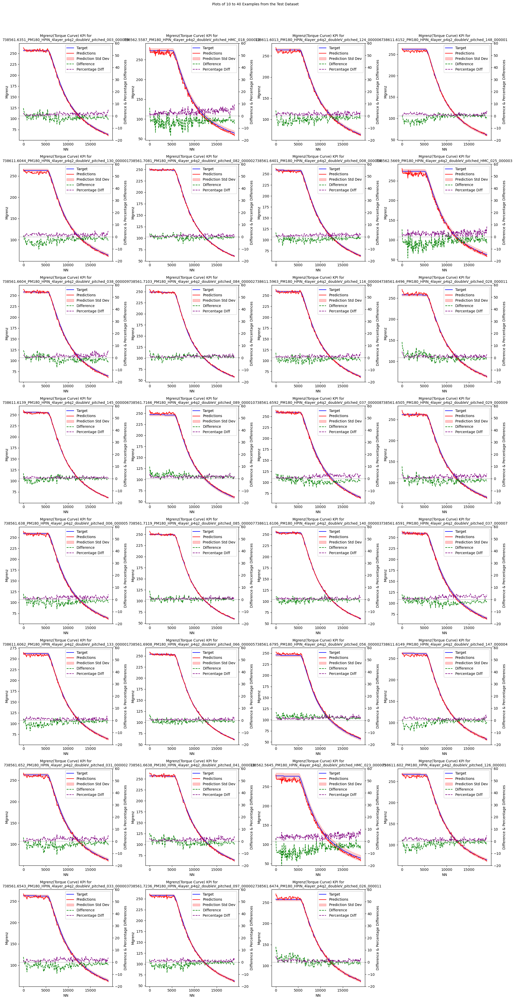

In [6]:
from src.inference import plot_testdataset_kpi2d, plot_mean_std_kpi2d, plot_std_kpi2d, eval_plot_kpi2d
eval_plot_kpi2d(df_test_y1_targets, df_predictions_y1,start=10, end=40, cols=4)

### Comparision Plots for Prediction Y2

Sample 0:
Original ETA shape: (544, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (544,)
Predicted MM shape: (561,)


<Figure size 2400x2000 with 0 Axes>

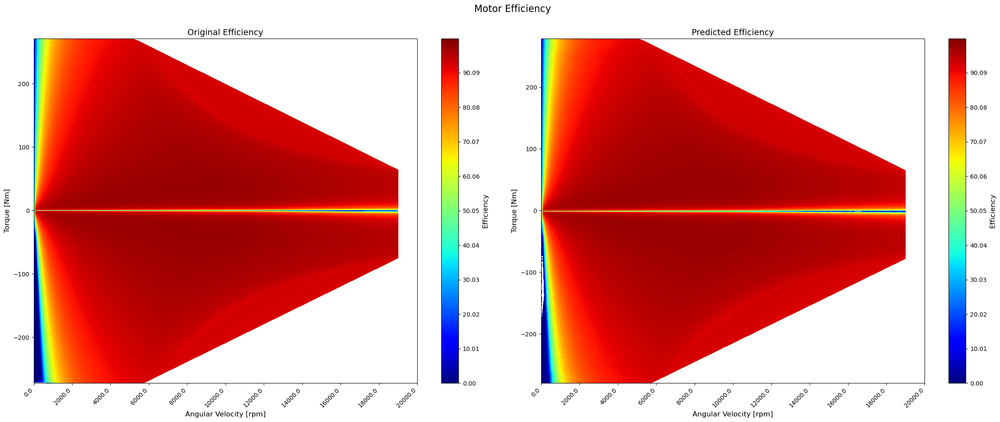

Sample 1:
Original ETA shape: (516, 191)
Predicted ETA shape: (523, 191)
Original MM shape: (516,)
Predicted MM shape: (523,)


<Figure size 2400x2000 with 0 Axes>

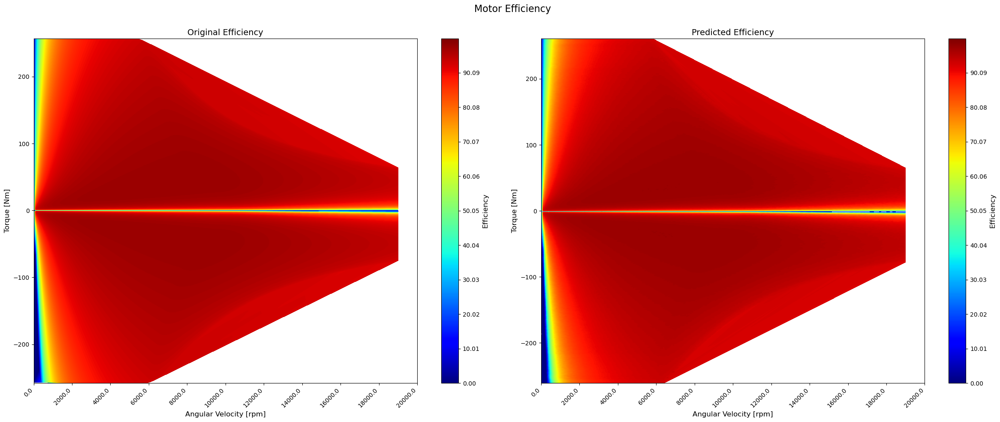

Sample 2:
Original ETA shape: (532, 191)
Predicted ETA shape: (545, 191)
Original MM shape: (532,)
Predicted MM shape: (545,)


<Figure size 2400x2000 with 0 Axes>

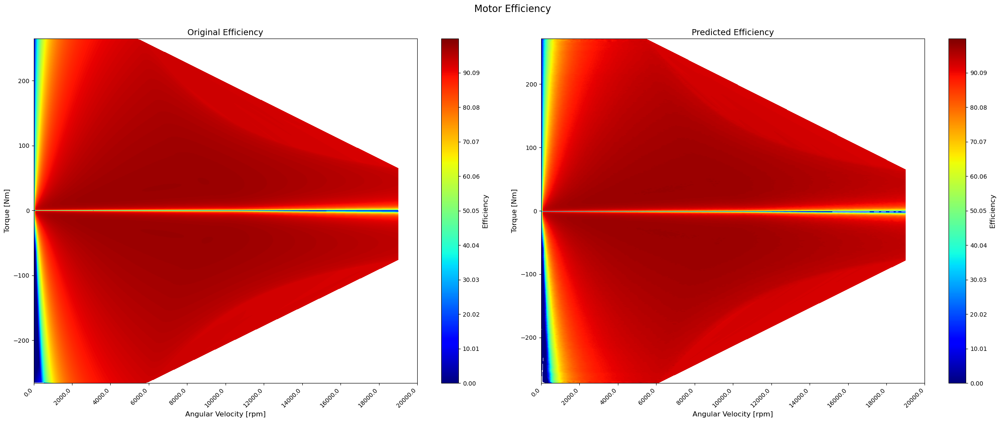

In [11]:
from src.utils import read_file_kpi3d, read_mm_nn
from src.inference import plot_kpi3d_dual
import numpy as np
import matplotlib.pyplot as plt

nn_kpi_2d = list(range(0, 19100, 100))
max_mgrenz_rounded = np.round(max_mgrenz).astype(int)
max_rows = (max_mgrenz_rounded * 2) + 1
nnkpi2darray = np.array(nn_kpi_2d)

start_index=0
max_index = 3

for index_no in range(start_index, max_index):
    
    filename_test = df_test_inputs.index[index_no]
    file_path = f'/home/k64889/Masters-Thesis/data/Testing/raw/{filename_test}.xlsx'

    # Read Original MM and ETA data from the Excel file
    mm_kpi3d = np.array(read_mm_nn(file_path, 'MM'))
    eta_kpi3d = read_file_kpi3d(file_path, 'ETA')
    
    eta_predicted = eta_matrix[index_no]
    mm_predicted = np.array(mm[index_no])
    
    print(f"Sample {index_no}:")
    print(f"Original ETA shape: {eta_kpi3d.shape}")
    print(f"Predicted ETA shape: {eta_predicted.shape}")
    print(f"Original MM shape: {mm_kpi3d.shape}")
    print(f"Predicted MM shape: {mm_predicted.shape}")
    
    #Instead of creating a new figure for each plot, add to a grid
    plt.figure(figsize=(24, 20))  # Adjust figure size for all subplots

    # Plot the dual KPI 3D graph
    plot_kpi3d_dual(nnkpi2darray, mm_kpi3d, eta_kpi3d, mm_predicted, eta_predicted, filename_test)

plt.show()

Sample 0:
Original ETA shape: (544, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (544,)
Predicted MM shape: (561,)


<Figure size 2400x2000 with 0 Axes>

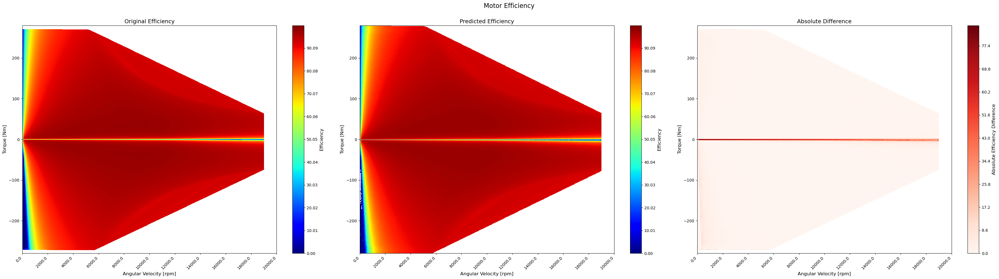

Sample 1:
Original ETA shape: (516, 191)
Predicted ETA shape: (523, 191)
Original MM shape: (516,)
Predicted MM shape: (523,)


<Figure size 2400x2000 with 0 Axes>

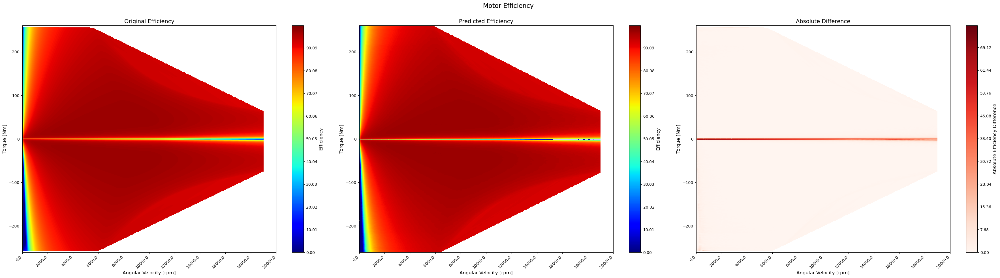

Sample 2:
Original ETA shape: (532, 191)
Predicted ETA shape: (545, 191)
Original MM shape: (532,)
Predicted MM shape: (545,)


<Figure size 2400x2000 with 0 Axes>

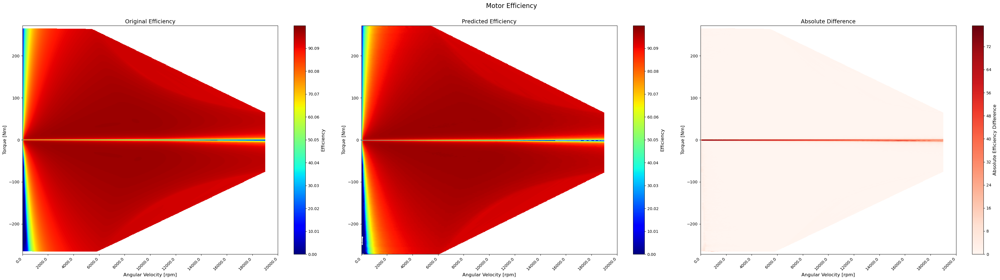

Sample 3:
Original ETA shape: (524, 191)
Predicted ETA shape: (529, 191)
Original MM shape: (524,)
Predicted MM shape: (529,)


<Figure size 2400x2000 with 0 Axes>

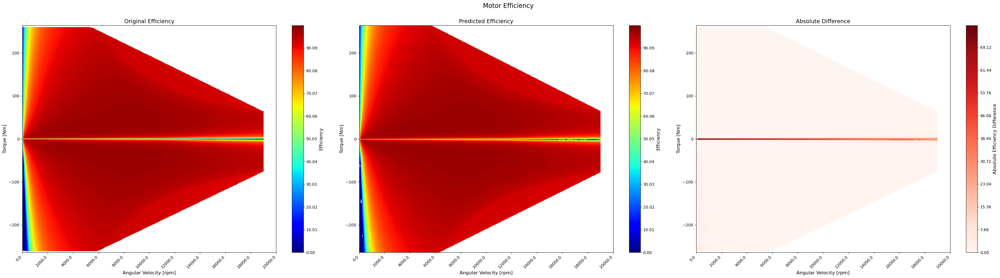

Sample 4:
Original ETA shape: (520, 191)
Predicted ETA shape: (525, 191)
Original MM shape: (520,)
Predicted MM shape: (525,)


<Figure size 2400x2000 with 0 Axes>

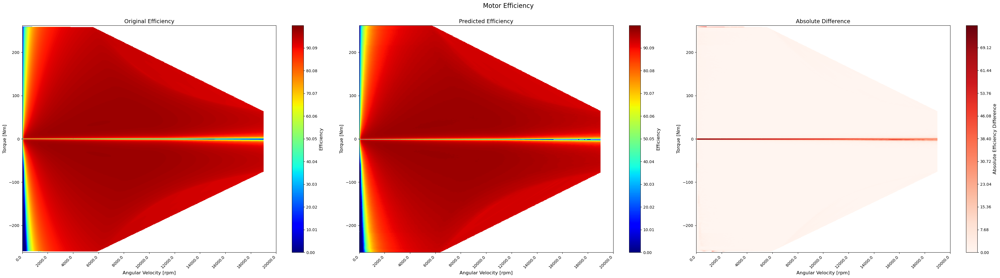

In [12]:
from src.utils import read_file_kpi3d, read_mm_nn
import numpy as np
import matplotlib.pyplot as plt
from src.inference import eval_plot_kpi3d

nn_kpi_2d = list(range(0, 19100, 100))
max_mgrenz_rounded = np.round(max_mgrenz).astype(int)
max_rows = (max_mgrenz_rounded * 2) + 1
nnkpi2darray = np.array(nn_kpi_2d)

start_index=0
max_index = 5

for index_no in range(start_index, max_index):
    
    filename_test = df_test_inputs.index[index_no]
    file_path = f'/home/k64889/Masters-Thesis/data/Testing/raw/{filename_test}.xlsx'

    # Read Original MM and ETA data from the Excel file
    mm_kpi3d = np.array(read_mm_nn(file_path, 'MM'))
    eta_kpi3d = read_file_kpi3d(file_path, 'ETA')
    
    eta_predicted = eta_matrix[index_no]
    mm_predicted = np.array(mm[index_no])
    
    print(f"Sample {index_no}:")
    print(f"Original ETA shape: {eta_kpi3d.shape}")
    print(f"Predicted ETA shape: {eta_predicted.shape}")
    print(f"Original MM shape: {mm_kpi3d.shape}")
    print(f"Predicted MM shape: {mm_predicted.shape}")
    
    #Instead of creating a new figure for each plot, add to a grid
    plt.figure(figsize=(24, 20))  # Adjust figure size for all subplots

    # Plot the dual KPI 3D graph
    eval_plot_kpi3d(nnkpi2darray, mm_kpi3d, eta_kpi3d, mm_predicted, eta_predicted, filename_test)

plt.show()

## Ablation Studies

### Baseline Average Y1

In [1]:
import numpy as np
import pandas as pd

In [2]:
df_y1=pd.read_csv('./data/TabularDataTargets.csv')
df_y1.rename(columns={'Unnamed: 0':'filename'}, inplace=True)

In [3]:
df_y1_avg = df_y1.drop(columns=['filename']).mean()
df_y1_avg = df_y1_avg.to_frame(name='Average').transpose()
df_y1_avg

,Column_1,Column_2,Column_3,Column_4,Column_5,Column_6,Column_7,Column_8,Column_9,Column_10,...,Column_182,Column_183,Column_184,Column_185,Column_186,Column_187,Column_188,Column_189,Column_190,Column_191
Average,257.240378,256.90682,256.896016,256.886563,256.875084,256.860905,256.846725,256.835922,256.818366,256.806887,...,65.884537,65.409858,65.00135,64.55368,64.128967,63.717758,63.280891,62.902768,62.471303,62.088454


Score calculation different for baseline as it is not based on index filename

In [11]:
index=df_test_y1_targets.index
score=0
y1_scores=[]
for index_no in range(len(index)):
    target_values = df_y1_avg.iloc[0].tolist()
    prediction_values = df_predictions_y1.loc[index[index_no]].tolist()

    deviations = np.array(prediction_values) - np.array(target_values)
    variance = np.mean(deviations ** 2)
    std_dev = np.sqrt(variance)
    y1_scores.append(std_dev)
    score+=std_dev

y1_score=score/len(index)
print(f"Average Y1 Score: {y1_score:.4f}")

Average Y1 Score: 3.7129


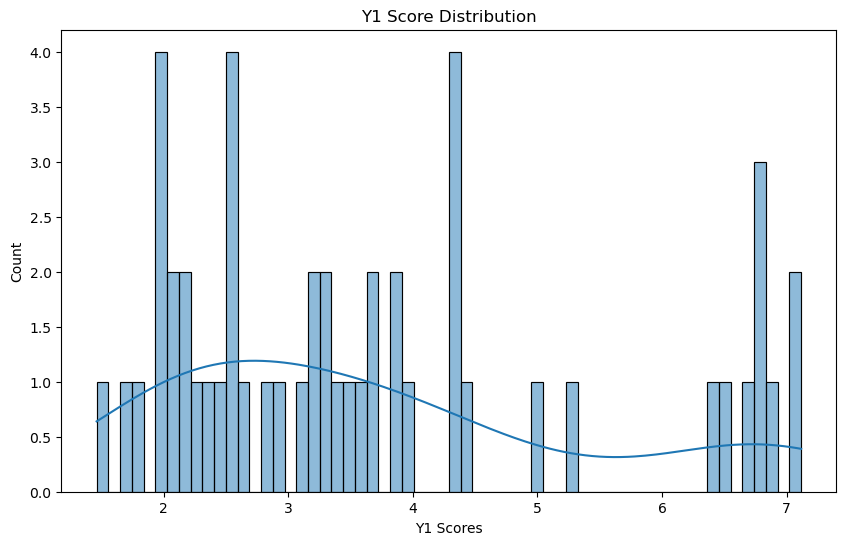

In [13]:
from src.inference import plot_scores
plot_scores(y1_scores, 'Y1')

### Plot standard deviation of the Test Values with that of the Baseline Average value

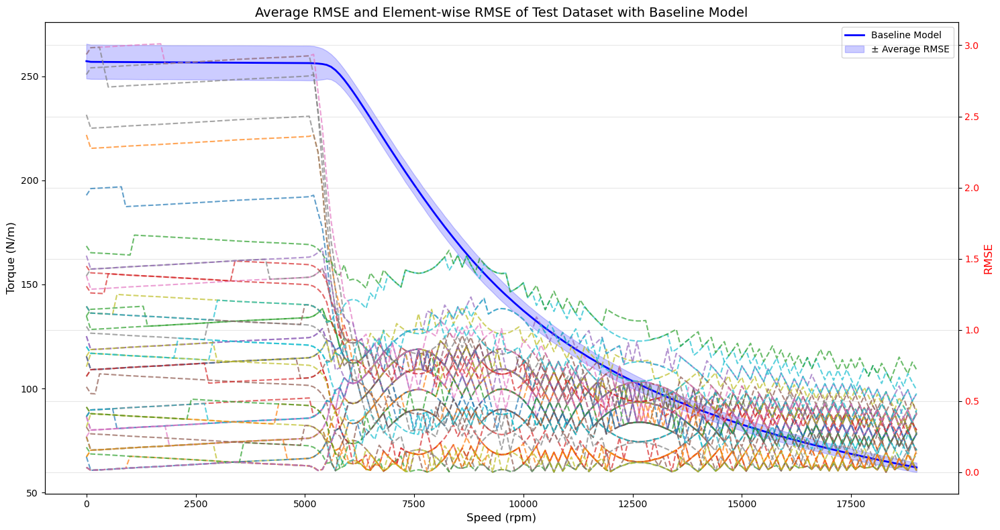

In [15]:
from src.inference import plot_kpi2d_stddev
plot_kpi2d_stddev(df_y1_avg, df_test_y1_targets, model= 'Baseline')

### MLP Prediction Y1

In [16]:
from src.inference import y1_score
y1_avg_score, y1_scores=y1_score(df_predictions_y1, df_test_y1_targets)
print(f"Average Y1 Score: {y1_avg_score:.4f}")

Average Y1 Score: 2.8629


Y1 Score 
{
    Excellent :0-1
    Good :1-2
    Good Enough :2-4
    Average :4-6
    Bad : >6
}

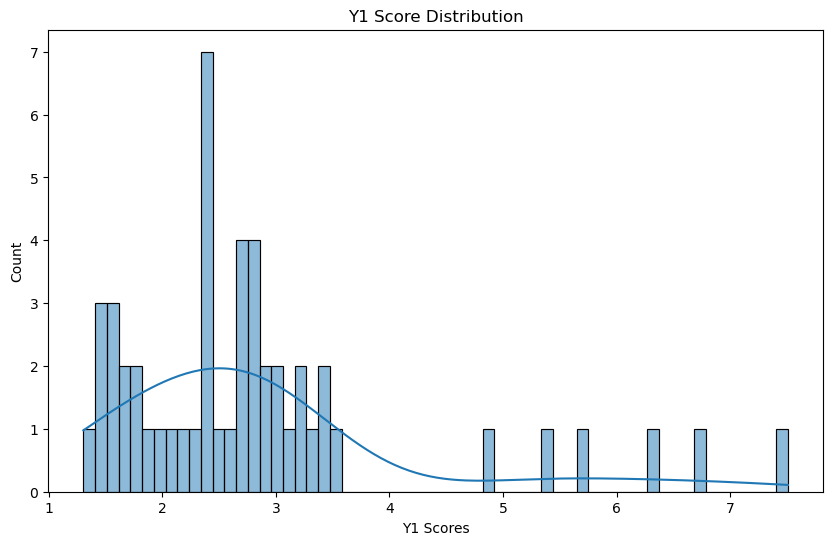

In [17]:
from src.inference import plot_scores
plot_scores(y1_scores, 'Y1')

### RMSE of the Test Values with that of the MLP Predictions Average value

In [19]:
df_predictions_y1
df_predictions_y1_avg = df_predictions_y1.mean()
df_y1_pred_avg = df_predictions_y1_avg.to_frame(name='Average MLP Prediction').transpose()
df_y1_pred_avg

,Column_1,Column_2,Column_3,Column_4,Column_5,Column_6,Column_7,Column_8,Column_9,Column_10,...,Column_182,Column_183,Column_184,Column_185,Column_186,Column_187,Column_188,Column_189,Column_190,Column_191
Average MLP Prediction,264.652405,261.037354,260.33313,258.698853,259.438599,258.026947,258.136749,256.850983,256.436005,257.679108,...,65.240814,65.496956,65.052193,65.023918,64.389046,63.873951,62.548805,62.282291,62.005882,60.732643


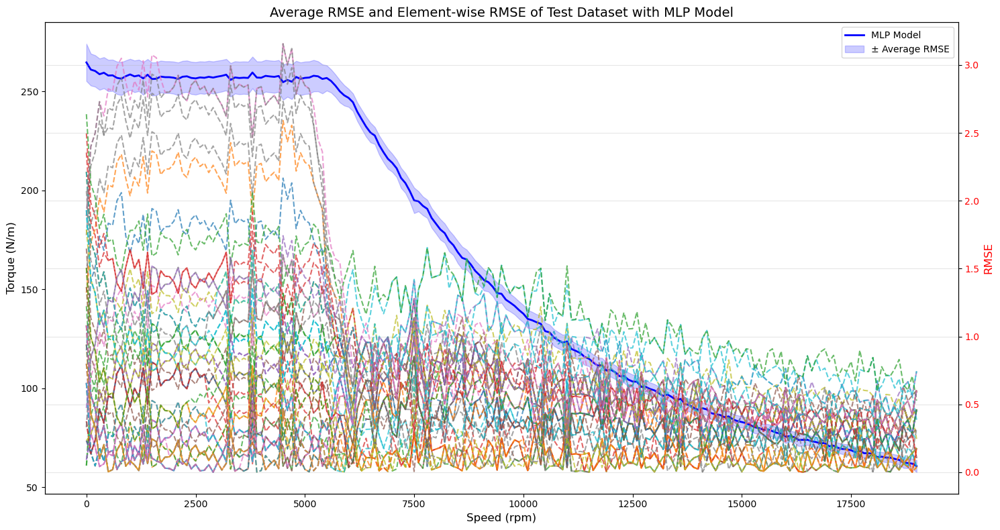

In [20]:
from src.inference import plot_kpi2d_stddev
plot_kpi2d_stddev(df_y1_pred_avg, df_test_y1_targets, model= 'MLP')

### Baseline Average Y2

In [10]:
import numpy as np
y2_grid = np.load('./data/TabularDataETA.npy')
# Calculate the average across all examples (axis=0)
y2_grid_avg = np.nanmean(y2_grid, axis=0)

/tmp/ipykernel_1988995/2412417757.py:4: RuntimeWarning: Mean of empty slice
  y2_grid_avg = np.nanmean(y2_grid, axis=0)


In [15]:
from src.utils import read_file_kpi3d
from src.inference import y2_score
import numpy as np

nn_kpi_2d = list(range(0, 19100, 100))
#nn_kpi_2d = read_mm_nn(file_path, 'NN')
max_mgrenz_rounded = np.round(max_mgrenz).astype(int)
max_rows = (max_mgrenz_rounded * 2) + 1
nnkpi2darray = np.array(nn_kpi_2d)

score=0
start_index=0
max_index = 49
y2_scores=[]

for index_no in range(start_index,max_index):
    
    eta_kpi3d = y2_grid_avg
    
    eta_predicted = eta_matrix[index_no]

    std_dev = y2_score(eta_kpi3d,eta_predicted)
    y2_scores.append(std_dev)
    score+=std_dev
    
y2_avg_score = score/(max_index-start_index)
print(f"Average Y2 Score: {y2_avg_score:.4f}")

Average Y2 Score: 0.8664


Y2 Score 
{
    Excellent :0-0.5
    Good :0.5-1
    Good Enough :1-2
    Average :2-4
    Bad : >4
}

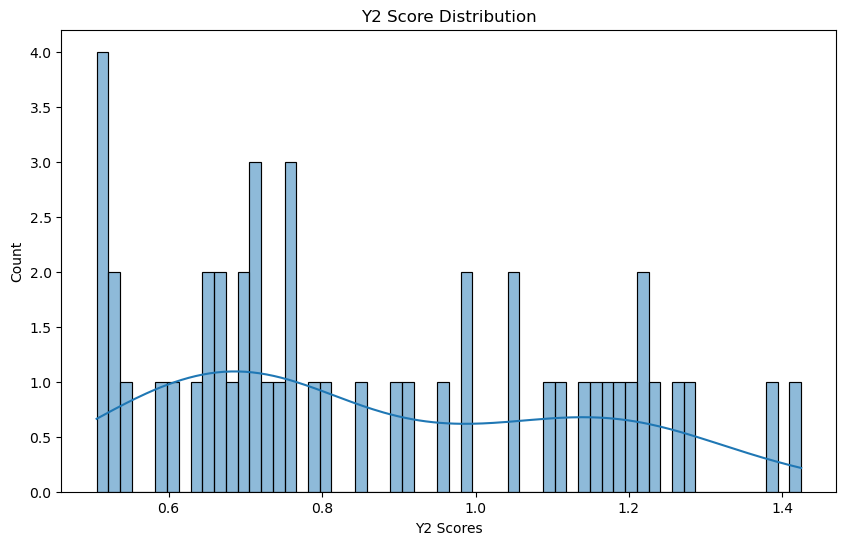

In [19]:
from src.inference import plot_scores
plot_scores(y2_scores, 'Y2')

In [13]:
df_y1_avg_rounded = df_y1_avg.round(0).astype(int)
max_value = df_y1_avg_rounded.max(axis=1).iloc[0]
mm_matrix=np.array(list(range(-max_mgrenz, max_mgrenz + 1)))

Sample 0:
Original ETA shape: (561, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (561,)
Predicted MM shape: (561,)


<Figure size 2400x2000 with 0 Axes>

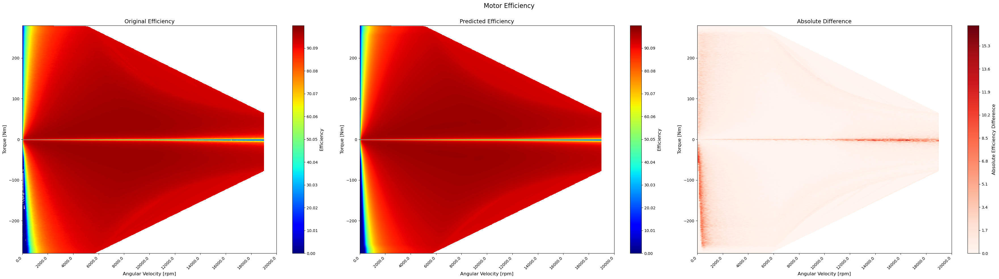

Sample 1:
Original ETA shape: (523, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (523,)
Predicted MM shape: (561,)


<Figure size 2400x2000 with 0 Axes>

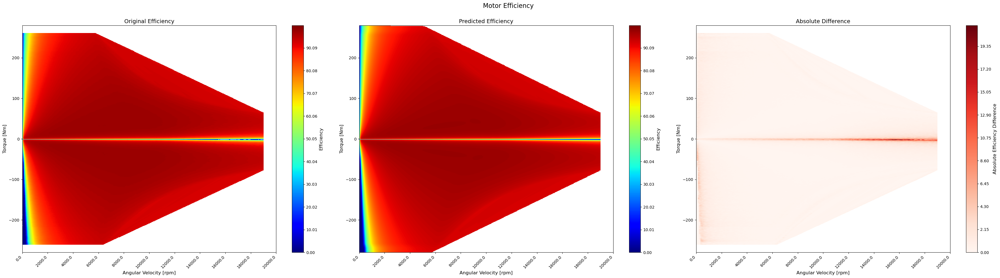

Sample 2:
Original ETA shape: (545, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (545,)
Predicted MM shape: (561,)


<Figure size 2400x2000 with 0 Axes>

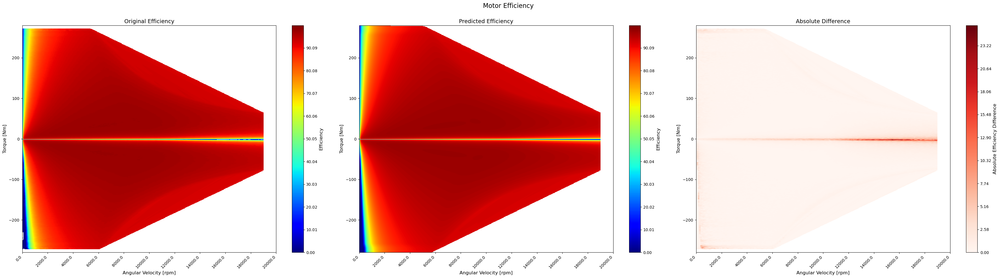

Sample 3:
Original ETA shape: (529, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (529,)
Predicted MM shape: (561,)


<Figure size 2400x2000 with 0 Axes>

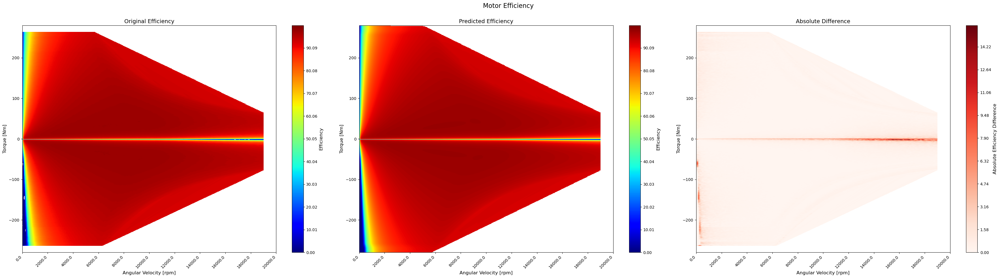

Sample 4:
Original ETA shape: (525, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (525,)
Predicted MM shape: (561,)


<Figure size 2400x2000 with 0 Axes>

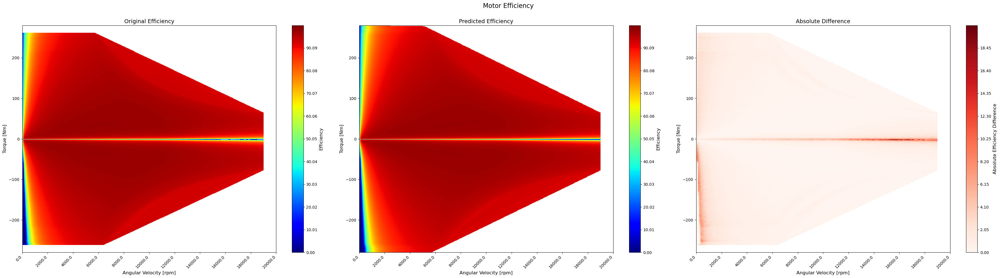

In [80]:
from src.utils import read_file_kpi3d, read_mm_nn
import numpy as np
import matplotlib.pyplot as plt
from src.inference import eval_plot_kpi3d

nn_kpi_2d = list(range(0, 19100, 100))
max_mgrenz_rounded = np.round(max_mgrenz).astype(int)
max_rows = (max_mgrenz_rounded * 2) + 1
nnkpi2darray = np.array(nn_kpi_2d)

start_index=0
max_index = 5

for index_no in range(start_index, max_index):
    
    filename_test = df_test_inputs.index[index_no]
    file_path = f'/home/k64889/Masters-Thesis/data/Testing/raw/{filename_test}.xlsx'

    # Read Original MM and ETA data from the Excel file
    
    eta_kpi3d = eta_matrix[index_no]
    mm_kpi3d = np.array(mm[index_no])
    
    eta_predicted = y2_grid_avg
    mm_predicted = mm_matrix
    
    print(f"Sample {index_no}:")
    print(f"Original ETA shape: {eta_kpi3d.shape}")
    print(f"Predicted ETA shape: {eta_predicted.shape}")
    print(f"Original MM shape: {mm_kpi3d.shape}")
    print(f"Predicted MM shape: {mm_predicted.shape}")
    
    #Instead of creating a new figure for each plot, add to a grid
    plt.figure(figsize=(24, 20))  # Adjust figure size for all subplots

    # Plot the dual KPI 3D graph
    eval_plot_kpi3d(nnkpi2darray, mm_kpi3d, eta_kpi3d, mm_predicted, eta_predicted, filename_test)

plt.show()

### Plot Each example RMSE and Standard Deviation of Test Dataset with Average Baseline

In [8]:
y2_test_grid=y2_grid[-50:, :, :]

/home/k64889/Masters-Thesis/src/inference.py:480: RuntimeWarning: Mean of empty slice
  rmse = (np.nanmean(squared_deviations, axis=0))**0.5


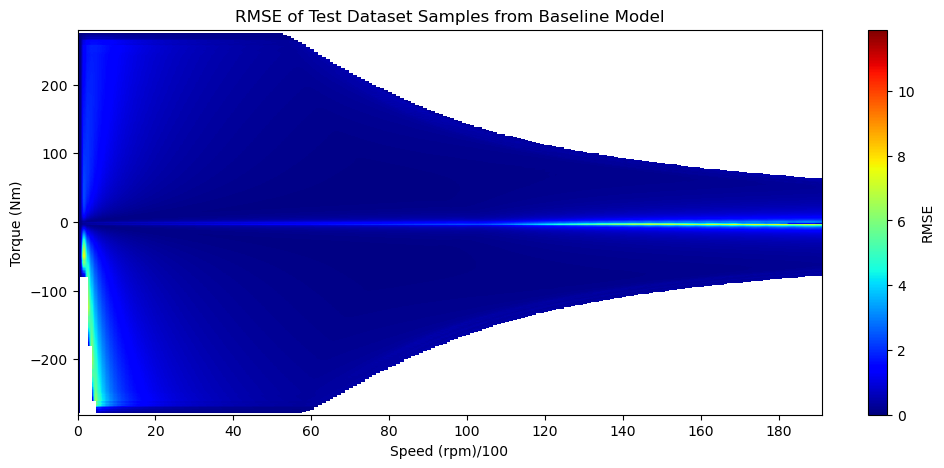

In [23]:
from src.inference import plot_kpi3d_stddev
plot_kpi3d_stddev(y2_grid_avg, y2_test_grid, model='Baseline')

### MLP Predictions Y2

In [11]:
# from src.utils import read_file_kpi3d
# from src.inference import y2_score
# import numpy as np

# nn_kpi_2d = list(range(0, 19100, 100))
# #nn_kpi_2d = read_mm_nn(file_path, 'NN')
# max_mgrenz_rounded = np.round(max_mgrenz).astype(int)
# max_rows = (max_mgrenz_rounded * 2) + 1
# nnkpi2darray = np.array(nn_kpi_2d)

# score=0
# start_index=0
# max_index =2
# y2_scores=[]
# y2_grid =[]

 
# for index in df_test_inputs.index:

#     file_path = f'/home/k64889/Masters-Thesis/data/Testing/raw/{index}.xlsx'
    
#     eta_test = read_file_kpi3d(file_path, 'ETA')

#     y2_grid.append(eta_test)
    
# y2_grid_avg = np.nanmean(y2_grid, axis=0)


Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x7f6664985750>>
Traceback (most recent call last):
  File "/home/k64889/miniconda3/envs/thesis/lib/python3.10/site-packages/ipykernel/ipkernel.py", line 775, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(
KeyboardInterrupt: 


ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (50,) + inhomogeneous part.

In [12]:
y2_grid

[array([[        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [ 0.        ,         nan,         nan, ...,         nan,
                 nan,         nan],
        [ 0.        ,         nan,         nan, ...,         nan,
                 nan,         nan],
        ...,
        [ 0.        , 19.67982221, 32.87615259, ...,         nan,
                 nan,         nan],
        [ 0.        , 19.61155439, 32.78084309, ...,         nan,
                 nan,         nan],
        [ 0.        , 19.54375562, 32.6860805 , ...,         nan,
                 nan,         nan]]),
 array([[        nan,         nan,         nan, ...,         nan,
                 nan,         nan],
        [ 0.        ,         nan,         nan, ...,         nan,
                 nan,         nan],
        [ 0.        ,         nan,         nan, ...,         nan,
                 nan,         nan],
        ...,
        [ 0.        , 23.50596935, 38.04391689, ...,  

In [11]:
from src.utils import read_file_kpi3d
from src.inference import y2_score
import numpy as np

nn_kpi_2d = list(range(0, 19100, 100))
#nn_kpi_2d = read_mm_nn(file_path, 'NN')
max_mgrenz_rounded = np.round(max_mgrenz).astype(int)
max_rows = (max_mgrenz_rounded * 2) + 1
nnkpi2darray = np.array(nn_kpi_2d)

score=0
start_index=0
max_index = 49
y2_scores=[]

y2_test_grid=y2_grid[-50:, :, :]

for index_no in range(start_index,max_index):
    
    filename_test = df_test_inputs.index[index_no]
    file_path = f'/home/k64889/Masters-Thesis/data/Testing/raw/{filename_test}.xlsx'

    #eta_kpi3d = read_file_kpi3d(file_path, 'ETA')
    
    eta_kpi3d = y2_test_grid[index_no]
    
    eta_predicted = eta_matrix[index_no]

    std_dev = y2_score(eta_kpi3d,eta_predicted)
    y2_scores.append(std_dev)
    score+=std_dev
    
y2_avg_score = score/(max_index-start_index)
print(f"Average Y2 Score: {y2_avg_score:.4f}")

Average Y2 Score: 0.4962


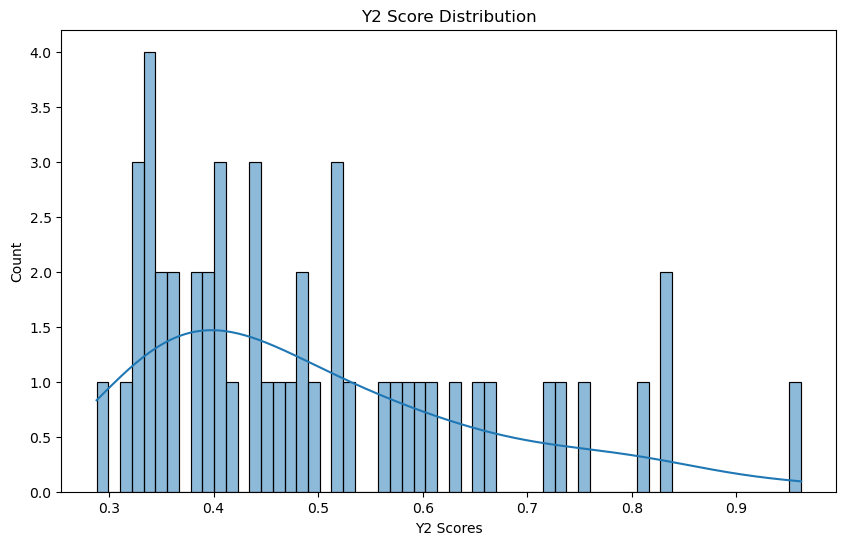

In [12]:
from src.inference import plot_scores
plot_scores(y2_scores, 'Y2')

In [13]:
from src.utils import read_file_kpi3d
from src.inference import y2_score
import numpy as np

nn_kpi_2d = list(range(0, 19100, 100))
#nn_kpi_2d = read_mm_nn(file_path, 'NN')
max_mgrenz_rounded = np.round(max_mgrenz).astype(int)
max_rows = (max_mgrenz_rounded * 2) + 1
nnkpi2darray = np.array(nn_kpi_2d)

score=0
start_index=0
max_index = 49
y2_scores=[]


for index_no in range(start_index,max_index):
    
    filename_test = df_test_inputs.index[index_no]
    file_path = f'/home/k64889/Masters-Thesis/data/Testing/raw/{filename_test}.xlsx'

    eta_kpi3d = read_file_kpi3d(file_path, 'ETA')

    
    eta_predicted = eta_matrix[index_no]

    std_dev = y2_score(eta_kpi3d,eta_predicted)
    y2_scores.append(std_dev)
    score+=std_dev
    
y2_avg_score = score/(max_index-start_index)
print(f"Average Y2 Score: {y2_avg_score:.4f}")

Average Y2 Score: 5.1117


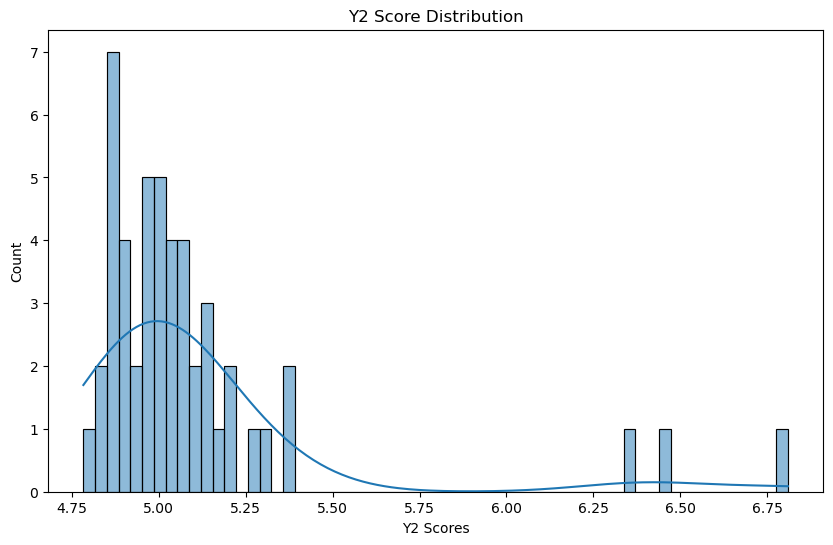

In [14]:
from src.inference import plot_scores
plot_scores(y2_scores, 'Y2')

Sample 0:
Original ETA shape: (544, 191)
Predicted ETA shape: (561, 191)
Original MM shape: (544,)
Predicted MM shape: (561,)


<Figure size 2400x2000 with 0 Axes>

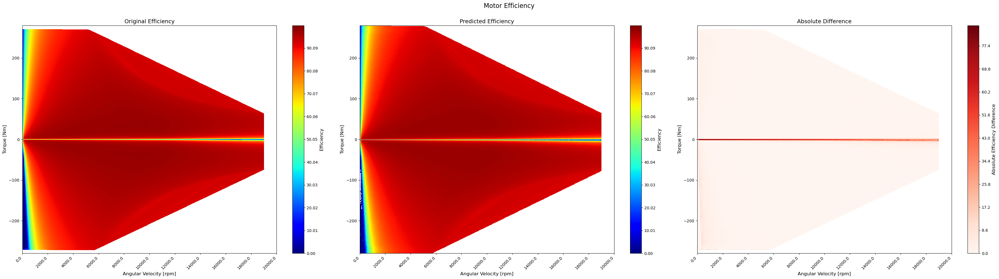

Sample 1:
Original ETA shape: (516, 191)
Predicted ETA shape: (523, 191)
Original MM shape: (516,)
Predicted MM shape: (523,)


<Figure size 2400x2000 with 0 Axes>

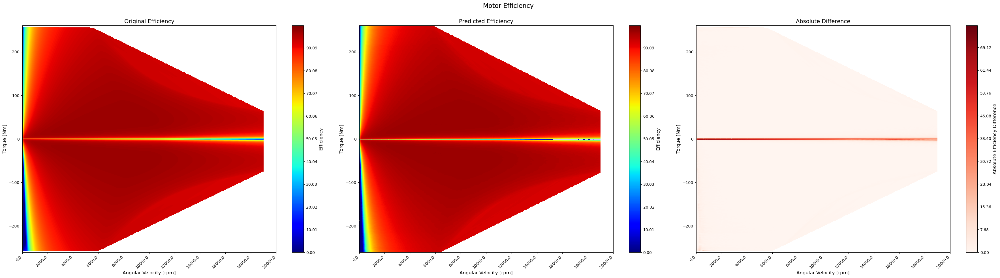

Sample 2:
Original ETA shape: (532, 191)
Predicted ETA shape: (545, 191)
Original MM shape: (532,)
Predicted MM shape: (545,)


<Figure size 2400x2000 with 0 Axes>

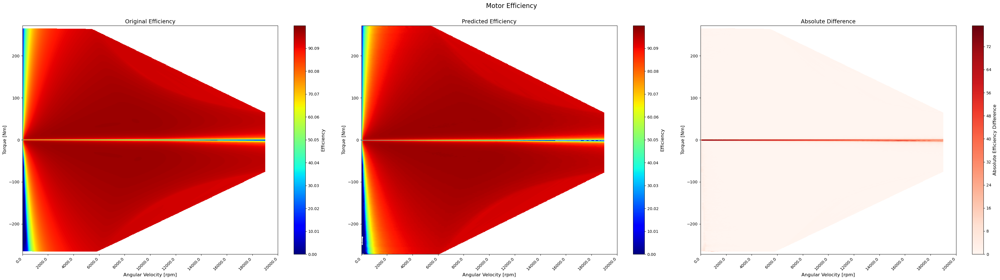

Sample 3:
Original ETA shape: (524, 191)
Predicted ETA shape: (529, 191)
Original MM shape: (524,)
Predicted MM shape: (529,)


<Figure size 2400x2000 with 0 Axes>

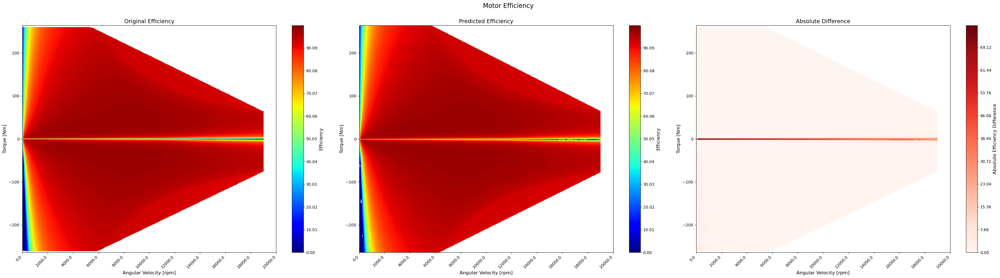

Sample 4:
Original ETA shape: (520, 191)
Predicted ETA shape: (525, 191)
Original MM shape: (520,)
Predicted MM shape: (525,)


<Figure size 2400x2000 with 0 Axes>

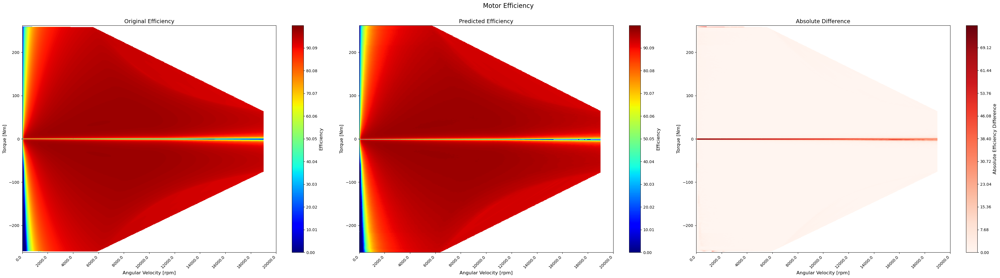

In [32]:
from src.utils import read_file_kpi3d, read_mm_nn
import numpy as np
import matplotlib.pyplot as plt
from src.inference import eval_plot_kpi3d

nn_kpi_2d = list(range(0, 19100, 100))
max_mgrenz_rounded = np.round(max_mgrenz).astype(int)
max_rows = (max_mgrenz_rounded * 2) + 1
nnkpi2darray = np.array(nn_kpi_2d)

start_index=0
max_index = 5

for index_no in range(start_index, max_index):
    
    filename_test = df_test_inputs.index[index_no]
    file_path = f'/home/k64889/Masters-Thesis/data/Testing/raw/{filename_test}.xlsx'

    # Read Original MM and ETA data from the Excel file
    mm_kpi3d = np.array(read_mm_nn(file_path, 'MM'))
    eta_kpi3d = read_file_kpi3d(file_path, 'ETA')
    
    eta_predicted = eta_matrix[index_no]
    mm_predicted = np.array(mm[index_no])
    
    print(f"Sample {index_no}:")
    print(f"Original ETA shape: {eta_kpi3d.shape}")
    print(f"Predicted ETA shape: {eta_predicted.shape}")
    print(f"Original MM shape: {mm_kpi3d.shape}")
    print(f"Predicted MM shape: {mm_predicted.shape}")
    
    #Instead of creating a new figure for each plot, add to a grid
    plt.figure(figsize=(24, 20))  # Adjust figure size for all subplots

    # Plot the dual KPI 3D graph
    eval_plot_kpi3d(nnkpi2darray, mm_kpi3d, eta_kpi3d, mm_predicted, eta_predicted, filename_test)

plt.show()

### Plot RMSE with Average MLP Predictions

In [29]:
y2_predicted_grid_avg = np.nanmean(y2_eta_padded, axis=0)

/tmp/ipykernel_1979519/370962014.py:1: RuntimeWarning: Mean of empty slice
  y2_predicted_grid_avg = np.nanmean(y2_eta_padded, axis=0)


/home/k64889/Masters-Thesis/src/inference.py:480: RuntimeWarning: Mean of empty slice
  rmse = (np.nanmean(squared_deviations, axis=0))**0.5


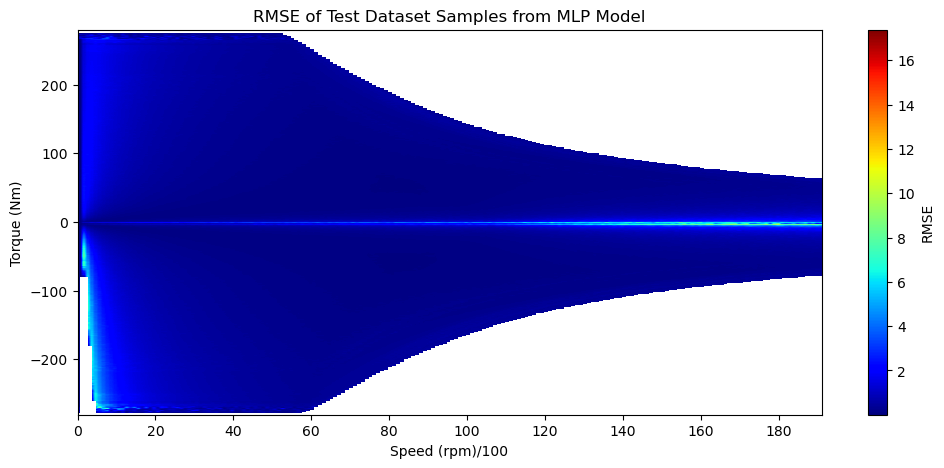

In [30]:
from src.inference import plot_kpi3d_stddev
plot_kpi3d_stddev(y2_predicted_grid_avg, y2_test_grid, model='MLP')

In [ ]:
Sklearn metrics

In [18]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, max_error, mean_poisson_deviance, mean_gamma_deviance, mean_absolute_percentage_error, d2_absolute_error_score
import numpy as np

def comprehensive_regression_metrics(df_targets, df_predictions):

    assert df_targets.index.equals(df_predictions.index), "Both target and prediction dfs must have the same index"
    
    metrics_list = []
    for index in df_targets.index:
        y_true = df_targets.loc[index].values
        y_pred = df_predictions.loc[index].values
        
        sample_metrics = {
            "MSE": mean_squared_error(y_true, y_pred),
            "RMSE": np.sqrt(mean_squared_error(y_true, y_pred)),
            "MAE": mean_absolute_error(y_true, y_pred),
            "R2": r2_score(y_true, y_pred),
            "Max Error": max_error(y_true, y_pred),
            "Mean Poisson Deviance": mean_poisson_deviance(y_true, y_pred),
            "Mean Gamma Deviance": mean_gamma_deviance(y_true, y_pred),
            "MAPE": mean_absolute_percentage_error(y_true, y_pred),
            "D2 Absolute Error Score": d2_absolute_error_score(y_true, y_pred)
        }
        metrics_list.append(sample_metrics)
    
    df_metrics = pd.DataFrame(metrics_list, index=df_targets.index)
    return df_metrics

In [19]:
result_metrics = comprehensive_regression_metrics(df_test_y1_targets, df_predictions_y1)
result_metrics

ValueError: Mean Tweedie deviance error with power=1 can only be used on non-negative y and strictly positive y_pred.

Mgrenz is now taken from training data and MM not calculated coz predicted ETA grid can have only 1 size ie, max size but padded when size is not supposed to be equal